In [14]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
import scvi
import torch
import warnings
import leidenalg as la
import anndata
from scipy.io import mmwrite
from matplotlib import pyplot as plt
from matplotlib.pyplot import rc_context
from scvi.autotune import ModelTuner
from ray import tune

In [3]:
print('scanpy version:', sc.__version__)

scanpy version: 1.9.6


In [4]:
import pynndescent
print('pynndescent version:', pynndescent.__version__)

pynndescent version: 0.5.13


In [5]:
import umap
print('umap version:', umap.__version__)

umap version: 0.5.6


In [6]:
warnings.filterwarnings('ignore')
sc.set_figure_params(dpi=200)
plt.rcParams['figure.figsize'] = [3,3]

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [8]:
os.chdir('/media/MPEdge16/MM137/sc/py/py_out/')

### Myeloid

In [15]:
myeloid = sc.read_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_subset_myeloid.h5ad')
adata = anndata.AnnData(X = myeloid.layers['counts'], obs = myeloid.obs, var = myeloid.raw.var)
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 10)
adata.var['MT'] = adata.var_names.str.startswith('MT-')
adata = adata[adata.obs.percent_mito <= 10]
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.highly_variable_genes(adata, n_top_genes=5000, subset = False, layer = 'counts', 
                            flavor = "seurat_v3", batch_key="lane")
adata_var = adata.var
csv_data = pd.read_csv('/media/MPEdge16/MM137/sc/EXCLUDE_XY_TCR_IG.csv', header = None)

positions = np.where(adata.var_names.isin(csv_data[0]))[0]
adata.var.iloc[positions, adata.var.columns.get_loc('highly_variable')] = False
adata.var['highly_variable'].value_counts()

highly_variable
False    15848
True      4737
Name: count, dtype: int64

In [16]:
model_cls = scvi.model.SCVI
model_cls.setup_anndata(adata = adata, layer = "counts", batch_key = 'lane', 
                        categorical_covariate_keys=['study_id'], 
                        continuous_covariate_keys=['percent_mito', 'nCount_RNA'])
tuner = ModelTuner(model_cls)
search_space = {
    "n_hidden": tune.choice([92, 128, 192, 256]),
    "n_latent": tune.choice([10, 20, 30, 40, 50, 60]),
    "n_layers": tune.choice([1, 2, 3]),
    "lr": tune.loguniform(1e-4, 1e-2),
    "gene_likelihood": tune.choice(["nb", "zinb"])}
results = tuner.fit(adata, metric="validation_loss",
                    resources = {'gpu': 1}, 
                    search_space = search_space,
                    num_samples = 100,
                    max_epochs = 20)

2024-09-06 02:02:37,085	INFO worker.py:1749 -- Started a local Ray instance.
2024-09-06 02:02:38,460	INFO tune.py:253 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.
2024-09-06 02:02:38,464	INFO tune.py:614 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949
(_trainable pid=2314445) /media/MPEdge16/miniconda_ns/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.
(_trainable pid=2314445) 
(_trainable pid=2314445) For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.
(_trainable pid=2314445) 
(_trainable pid=2314445) For creation, use `anndata.experimental.sparse_dataset(X)` ins

In [17]:
best_vl = 10000
best_i = 0
for i in range(len(results.results)):
    if 'validation_loss' in results.results[i].metrics.keys():
        vl = results.results[i].metrics['validation_loss']
        if vl < best_vl:
            best_vl = vl
            best_i = i
    else:
        continue
results.results[best_i]

Result(
  metrics={'validation_loss': 4336.4892578125},
  path='/media/MPEdge16/MM137/sc/py/scvi_log/autotune/2024-09-06_02-02-31_scvi/_trainable_a812efc0_7_gene_likelihood=nb,lr=0.0058,n_hidden=92,n_latent=60,n_layers=2_2024-09-06_02-09-35',
  filesystem='local',
  checkpoint=None
)

In [18]:
scvi.model.SCVI.setup_anndata(adata = adata, layer = "counts", batch_key = 'lane', 
                              categorical_covariate_keys=['study_id'], 
                              continuous_covariate_keys=['percent_mito', 'nCount_RNA'])
model = scvi.model.SCVI(adata, n_hidden = 92, n_latent = 60, n_layers = 2, gene_likelihood = 'nb')
kwargs = {'lr': 0.0058}
model.train(max_epochs = 200, early_stopping = True, plan_kwargs = kwargs)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX 4000 Ada Generation') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 200/200 [24:29<00:00,  7.50s/it, v_num=1, train_loss_step=4.3e+3, train_loss_epoch=4.35e+3]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 200/200 [24:29<00:00,  7.35s/it, v_num=1, train_loss_step=4.3e+3, train_loss_epoch=4.35e+3]


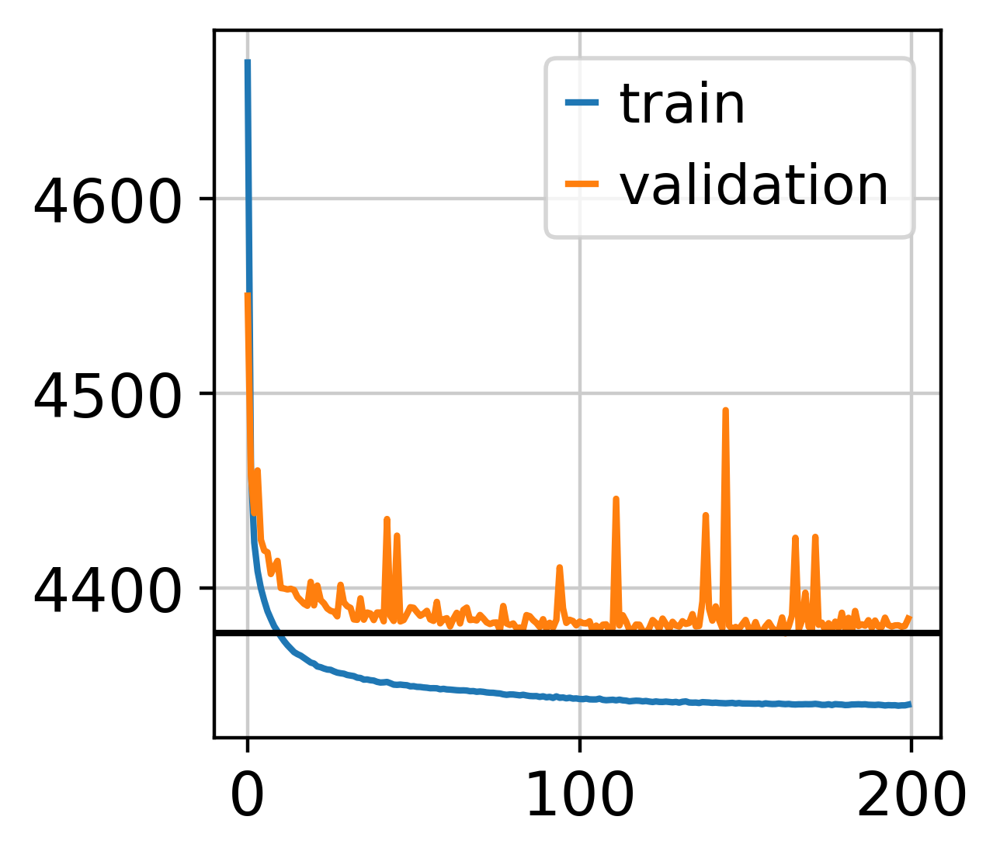

In [19]:
y = model.history['reconstruction_loss_validation']['reconstruction_loss_validation'].min()
plt.plot(model.history['reconstruction_loss_train']['reconstruction_loss_train'], label='train')
plt.plot(model.history['reconstruction_loss_validation']['reconstruction_loss_validation'], label='validation')

plt.axhline(y, c = 'k')

plt.legend()
plt.show()

In [9]:
adata = sc.read_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/temp_pbmc_myeloid.h5ad')
#model.save('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model')
model = scvi.model.SCVI.load('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model/', adata)
#adata.write_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/temp_pbmc_myeloid.h5ad')

INFO     File /media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model/model.pt already         
         downloaded                                                                                                


In [10]:
adata.obsm['X_scVI'] = model.get_latent_representation()
scvi_norm_count = model.get_normalized_expression(library_size = 1e4)
adata.layers['scvi_normalized'] = scvi_norm_count

In [11]:
sc.pp.neighbors(adata, use_rep = 'X_scVI', random_state = 123)
sc.tl.umap(adata)

In [30]:
sc.tl.leiden(adata, resolution = 1, key_added = 'overcluster')

In [31]:
adata.write_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_int.h5ad')

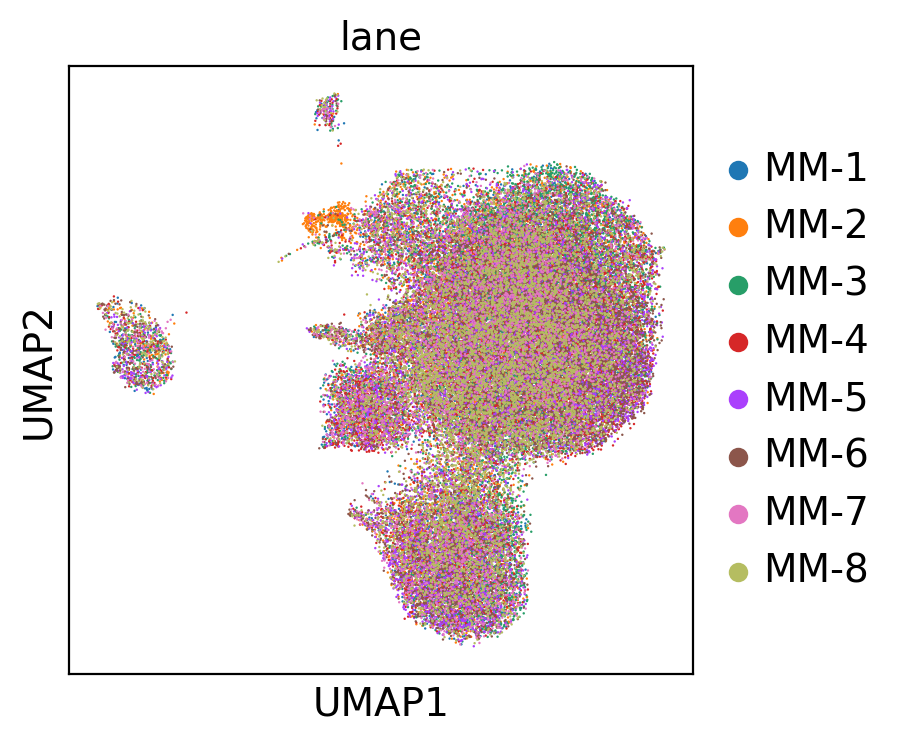

In [32]:
sc.pl.umap(adata, color = 'lane', size = 3, legend_fontsize = 'medium')

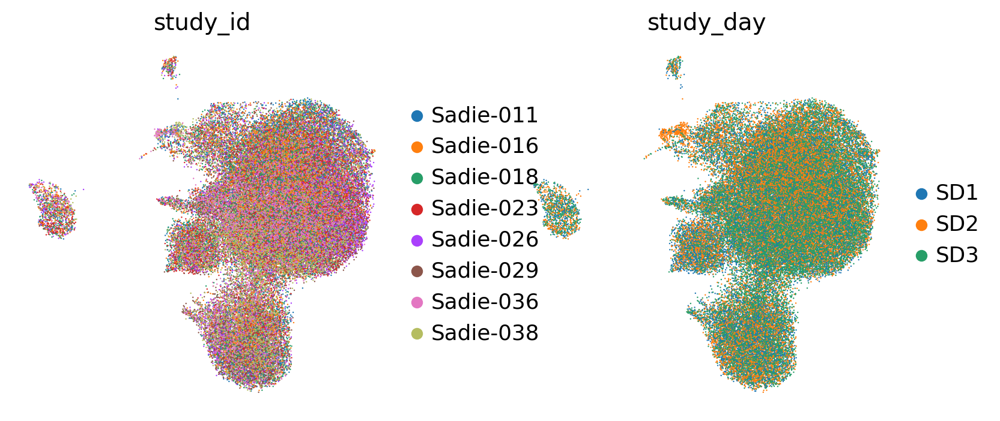

In [33]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color = ['study_id', 'study_day'], size = 3, frameon = False)

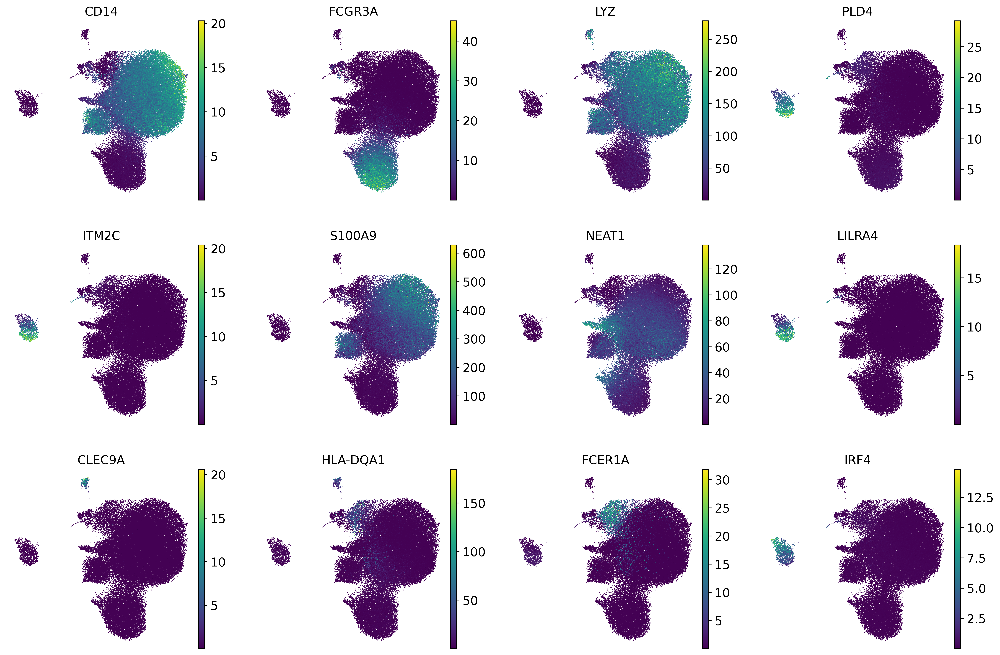

In [34]:
sc.set_figure_params(dpi=200)

sc.pl.umap(adata, color = ['CD14','FCGR3A','LYZ','PLD4','ITM2C','S100A9','NEAT1','LILRA4','CLEC9A','HLA-DQA1','FCER1A','IRF4'], size = 4, frameon = False, layer = 'scvi_normalized')

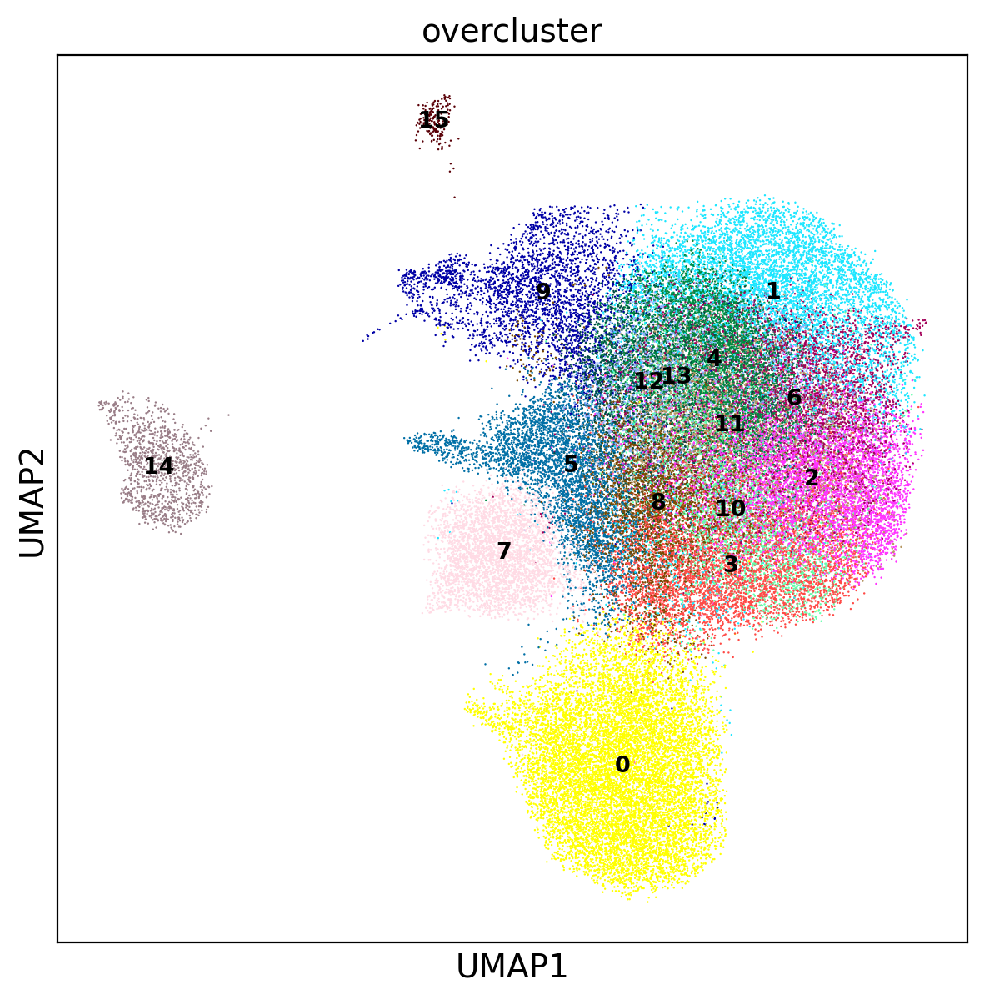

In [44]:
plt.rcParams['figure.figsize'] = [7, 7]
sc.pl.umap(adata, color = ['overcluster'], legend_loc = 'on data', size = 3, layer = 'scvi_normalized', legend_fontsize = 'x-small')

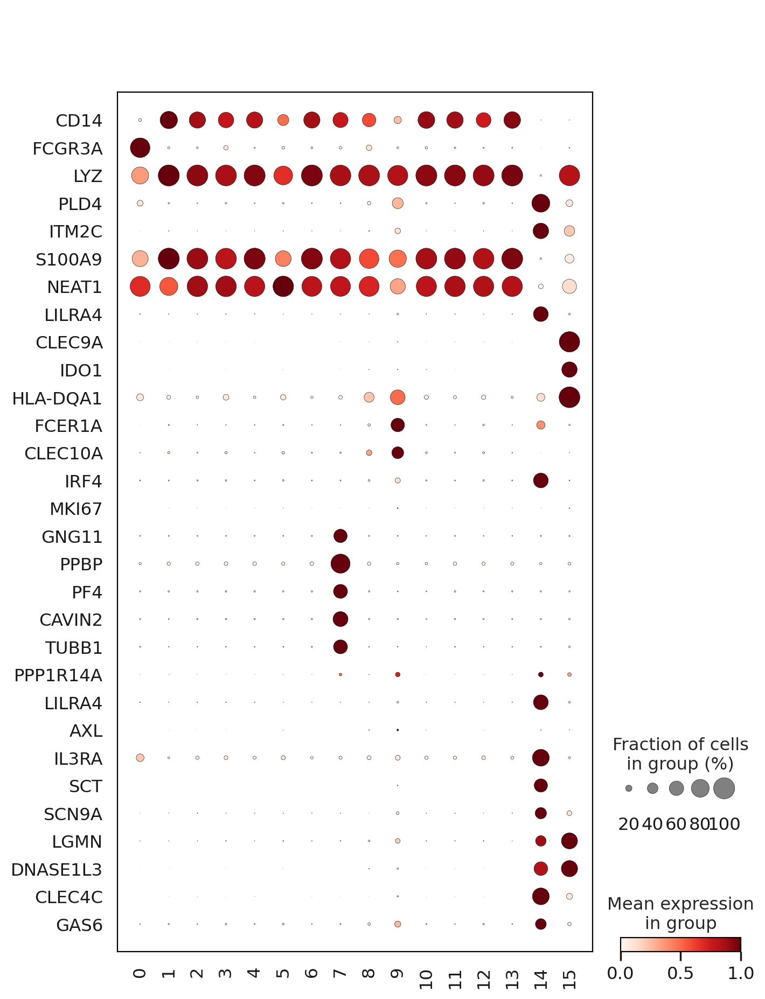

In [24]:
sc.set_figure_params(dpi=100)
sc.pl.dotplot(adata, ['CD14','FCGR3A','LYZ','PLD4','ITM2C','S100A9','NEAT1','LILRA4','CLEC9A','IDO1','HLA-DQA1','FCER1A','CLEC10A','IRF4','MKI67','GNG11','PPBP','PF4','CAVIN2','TUBB1'], groupby = 'overcluster', swap_axes = True,
              use_raw = True, standard_scale = 'var', dendrogram = False)

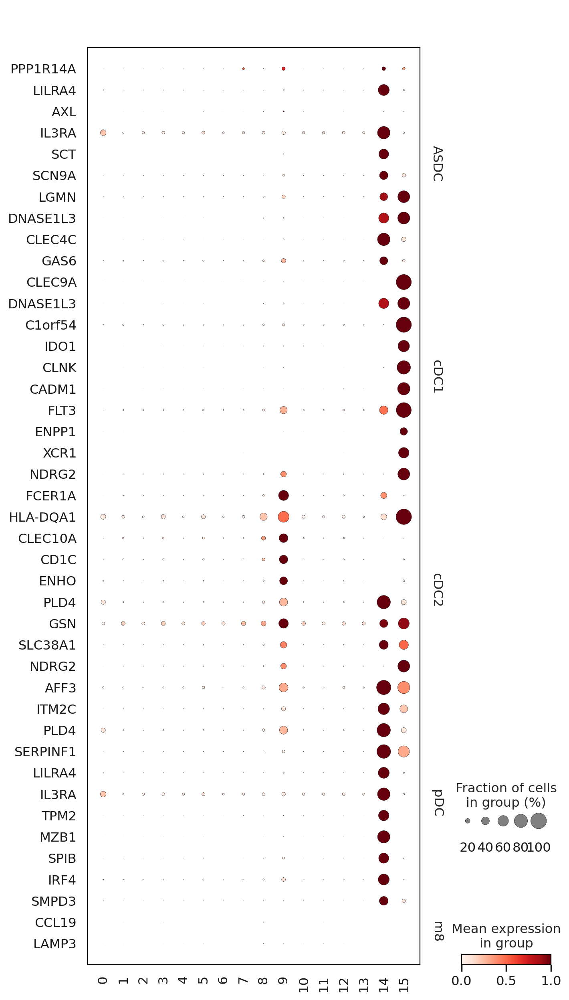

In [33]:
asdc = ['PPP1R14A', 'LILRA4', 'AXL', 'IL3RA', 'SCT', 'SCN9A', 'LGMN', 'DNASE1L3', 'CLEC4C', 'GAS6']
cdc1 = ['CLEC9A', 'DNASE1L3', 'C1orf54', 'IDO1', 'CLNK', 'CADM1', 'FLT3', 'ENPP1', 'XCR1', 'NDRG2']
cdc2 = ['FCER1A', 'HLA-DQA1', 'CLEC10A', 'CD1C', 'ENHO', 'PLD4', 'GSN', 'SLC38A1', 'NDRG2', 'AFF3']
pdc = ['ITM2C', 'PLD4', 'SERPINF1', 'LILRA4', 'IL3RA', 'TPM2', 'MZB1', 'SPIB', 'IRF4', 'SMPD3']
#np.concatenate((asdc,cdc1,cdc2,pdc))
sc.set_figure_params(dpi=100)
sc.pl.dotplot(adata, {'ASDC': asdc, 'cDC1': cdc1, 'cDC2': cdc2, 'pDC': pdc, 'm8': ['CCL19','LAMP3']}, groupby = 'overcluster', swap_axes = True,
              use_raw = True, standard_scale = 'var', dendrogram = False)

In [40]:
#uclus = max(adata.obs['overcluster'].astype(int))
#for i in range(uclus+1):
#    print("'" + str(i) + "'" + ": " + "'" + "',")

In [15]:
myeloid_types = {
    '0': 'CD16 Mono',
    '1': 'CD14 Mono',
    '2': 'CD14 Mono',
    '3': 'CD14 Mono',
    '4': 'CD14 Mono',
    '5': 'CD14 Mono',
    '6': 'CD14 Mono',
    '7': 'M-platelet',
    '8': 'CD14 Mono', # CCL19, LAMP3 look interesting here but non-zero % express is < 1%
    '9': 'cDC2',
    '10': 'CD14 Mono',
    '11': 'CD14 Mono',
    '12': 'CD14 Mono',
    '13': 'CD14 Mono',
    '14': 'pDC',
    '15': 'cDC1'
}

In [16]:
adata.obs['merged_type'] = adata.obs['overcluster'].map(myeloid_types)
#adata.obs

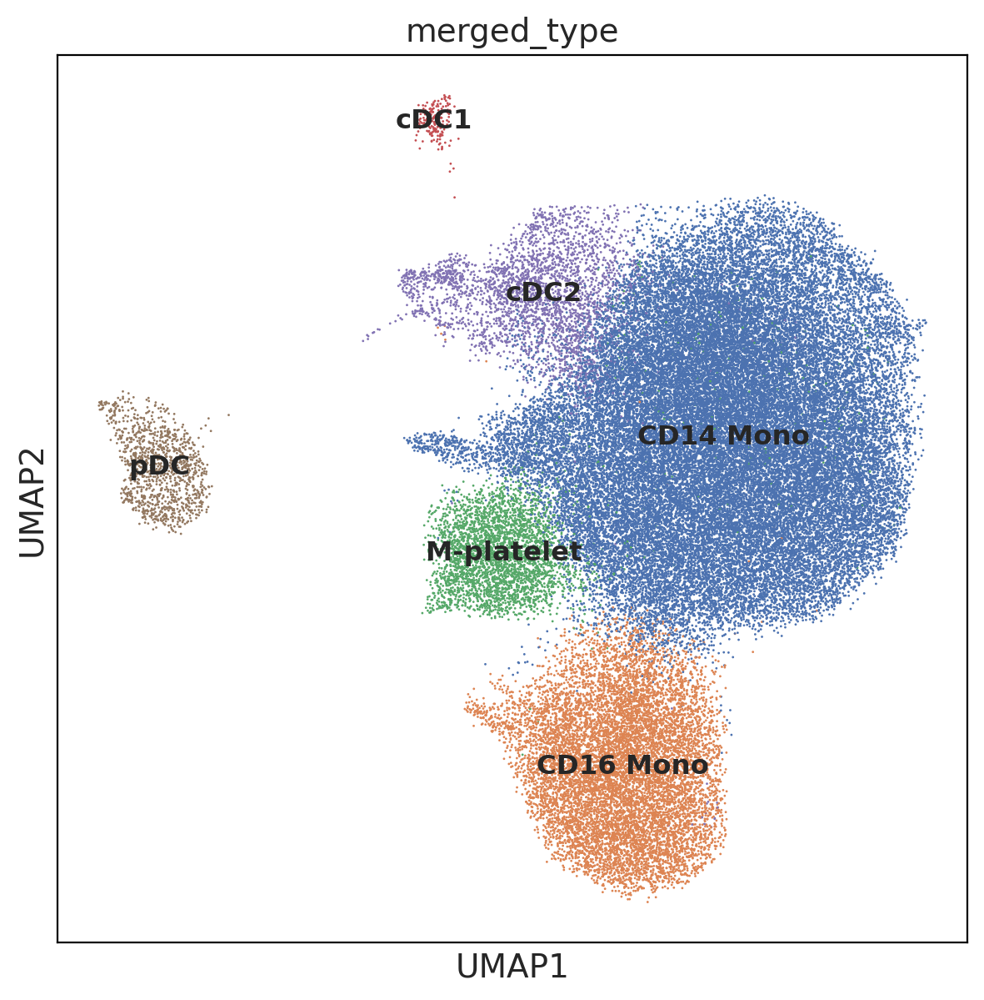

In [34]:
plt.rcParams['figure.figsize'] = [7, 7]
sc.pl.umap(adata, color = ['merged_type'], legend_loc = 'on data', size = 4, layer = 'scvi_normalized', legend_fontsize = 'small')

In [9]:
# adata.write_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid.h5ad')
adata = sc.read_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid.h5ad')

In [ ]:
adata.obs['merged_type'].value_counts()

In [22]:
adata.obs[['barcode_2','overcluster','merged_type']].to_csv('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_cell_map.csv', index = False)

In [11]:
adata.layers

Layers with keys: counts, scvi_normalized

In [12]:
latent_coord = adata.obsm['X_scVI']
umap_coord = adata.obsm['X_umap']
rna_counts = adata.layers['counts'] # whole integer counts, no normalization
adata_obs = adata.obs
adata_var = adata.var

In [15]:
mmwrite('/media/MPEdge16/MM137/sc/py/py_out/pbmc/anndata_elements/adata_pbmc_myeloid_counts.mtx', rna_counts)
adata_obs.to_csv('/media/MPEdge16/MM137/sc/py/py_out/pbmc/anndata_elements/adata_pbmc_myeloid_obs.csv')
adata_var.to_csv('/media/MPEdge16/MM137/sc/py/py_out/pbmc/anndata_elements/adata_pbmc_myeloid_var.csv')

In [16]:
np.savetxt('/media/MPEdge16/MM137/sc/py/py_out/pbmc/anndata_elements/adata_pbmc_myeloid_latent_coordinates.csv', latent_coord, delimiter = ',')
np.savetxt('/media/MPEdge16/MM137/sc/py/py_out/pbmc/anndata_elements/adata_pbmc_myeloid_umap_coordinates.csv', umap_coord, delimiter = ',')

### DGE by scVI

In [1]:
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as p9
import scanpy as sc
import scvi
import seaborn as sns
import torch

In [3]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [4]:
warnings.filterwarnings('ignore')

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [6]:
os.chdir('/media/MPEdge16/MM137/sc/py/py_out/')

In [7]:
adata = sc.read_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid.h5ad')
model = scvi.model.SCVI.load('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model/', adata)

INFO     File /media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model/model.pt already         
         downloaded                                                                                                


In [8]:
cluster_nums = pd.Series(adata.obs['overcluster'].values.unique()).astype(int).sort_values().values

In [9]:
cluster_nums

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15])

In [10]:
for i in range(len(cluster_nums)):
    cell_type_1 = str(cluster_nums[i])
    print('starting on: ' + cell_type_1)
    adata.obs['dge_cluster'] = [x if x==cell_type_1 else 'other' for x in adata.obs['overcluster']]
    cell_type_2 = 'other'
    
    cell_idx1 = adata.obs["dge_cluster"] == cell_type_1
    cell_idx2 = adata.obs["dge_cluster"] == cell_type_2
    
    de_change = model.differential_expression(adata = adata, idx1 = cell_idx1, idx2 = cell_idx2, batch_correction = True)
    de_narrow = de_change[['proba_de','lfc_mean','lfc_median','is_de_fdr_0.05','non_zeros_proportion1','non_zeros_proportion2']]
    de_narrow['gene'] = de_narrow.index
    de_narrow['cluster1'] = cell_type_1
    de_narrow['cluster2'] = cell_type_2
    if i==0:
        de_result = de_narrow
    else:
        de_result = pd.concat([de_result, de_narrow])
de_result.to_csv('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_dge_cluster.csv', index = False)

starting on: 0
DE...: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:14<00:00, 74.91s/it]
starting on: 1
DE...: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:12<00:00, 72.87s/it]
starting on: 2
DE...: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:11<00:00, 71.55s/it]
starting on: 3
DE...: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:10<00:00, 70.62s/it]
starting on: 4
DE...: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████

### DGE by scVI SD1, SD3

In [1]:
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as p9
import scanpy as sc
import scvi
import seaborn as sns
import torch

In [2]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")

In [3]:
%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [5]:
os.chdir('/media/MPEdge16/MM137/sc/py/py_out/')

In [6]:
adata = sc.read_h5ad('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid.h5ad')
model = scvi.model.SCVI.load('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model/', adata)

INFO     File /media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_integration_model/model.pt already         
         downloaded                                                                                                


/media/MPEdge16/miniconda_ns/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



In [7]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent_mito,barcode_1,lane,solo_X,solo_doublet,solo_singlet,solo_prediction,study_id,study_day,barcode_2,n_genes,_scvi_batch,_scvi_labels,overcluster,merged_type
barcode_2,,,,,,,,,,,,,,,,,,
AAACCTGAGAGGTTGC-1,SeuratProject,4311,1966,3.757829,AAACCTGAGAGGTTGC-1,MM-1,AAACCTGAGAGGTTGC-1,-1.430171,0.703773,singlet,Sadie-011,SD1,AAACCTGAGAGGTTGC-1,1966,0,0,11,CD14 Mono
AAACCTGAGTCCGGTC-1,SeuratProject,1410,841,3.333333,AAACCTGAGTCCGGTC-1,MM-1,AAACCTGAGTCCGGTC-1,-2.567712,1.236498,singlet,Sadie-016,SD1,AAACCTGAGTCCGGTC-1,841,0,0,5,CD14 Mono
AAACCTGCAATCTACG-1,SeuratProject,3489,1803,1.777013,AAACCTGCAATCTACG-1,MM-1,AAACCTGCAATCTACG-1,-1.718441,1.042089,singlet,Sadie-018,SD1,AAACCTGCAATCTACG-1,1803,0,0,2,CD14 Mono
AAACCTGGTATATGAG-1,SeuratProject,5062,2075,2.607665,AAACCTGGTATATGAG-1,MM-1,AAACCTGGTATATGAG-1,-1.700990,1.079332,singlet,Sadie-016,SD1,AAACCTGGTATATGAG-1,2075,0,0,8,CD14 Mono
AAACCTGGTCCATGAT-1,SeuratProject,5400,2131,3.111111,AAACCTGGTCCATGAT-1,MM-1,AAACCTGGTCCATGAT-1,-2.206934,1.405705,singlet,Sadie-011,SD1,AAACCTGGTCCATGAT-1,2131,0,0,10,CD14 Mono
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGACTACT-8,SeuratProject,2894,1609,3.213545,TTTGTCAGTGACTACT-1,MM-8,TTTGTCAGTGACTACT-1,-0.855300,1.056151,singlet,Sadie-016,SD2,TTTGTCAGTGACTACT-8,1608,7,0,4,CD14 Mono
TTTGTCAGTTCGTCTC-8,SeuratProject,11250,3148,1.635556,TTTGTCAGTTCGTCTC-1,MM-8,TTTGTCAGTTCGTCTC-1,-1.529901,1.787391,singlet,Sadie-036,SD3,TTTGTCAGTTCGTCTC-8,3148,7,0,8,CD14 Mono
TTTGTCATCACCTCGT-8,SeuratProject,3451,1563,2.636917,TTTGTCATCACCTCGT-1,MM-8,TTTGTCATCACCTCGT-1,-1.844406,2.062644,singlet,Sadie-016,SD2,TTTGTCATCACCTCGT-8,1563,7,0,9,cDC2


In [8]:
cluster_nums = pd.Series(adata.obs['overcluster'].values.unique()).astype(int).sort_values().values
cluster_nums

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15])

In [9]:
adata.obs['dge_grouping'] = [str(x)+'_'+str(y) for x,y in zip(adata.obs['overcluster'],adata.obs["study_day"])]
adata.obs['dge_grouping'].value_counts()

dge_grouping
0_SD3     3796
0_SD2     3668
0_SD1     3131
1_SD3     2674
1_SD2     2095
3_SD3     2019
2_SD3     2016
2_SD2     2005
4_SD2     1847
5_SD3     1656
6_SD3     1583
3_SD1     1473
3_SD2     1473
7_SD1     1472
4_SD3     1464
4_SD1     1459
5_SD2     1451
6_SD2     1448
1_SD1     1440
2_SD1     1431
9_SD2     1383
8_SD3     1380
6_SD1     1256
5_SD1     1246
10_SD2    1241
7_SD2     1178
10_SD3    1159
11_SD2    1151
8_SD2     1117
9_SD3      956
12_SD2     949
11_SD3     947
13_SD3     916
7_SD3      915
11_SD1     831
8_SD1      818
12_SD3     768
9_SD1      763
13_SD2     729
12_SD1     721
10_SD1     682
13_SD1     531
14_SD3     432
14_SD2     389
14_SD1     325
15_SD1      63
15_SD2      62
15_SD3      59
Name: count, dtype: int64

In [10]:
for i in range(len(cluster_nums)):
    scvi.settings.seed = 0
    cell_type_dge = str(cluster_nums[i])
    print('starting on: ' + cell_type_dge)
    
    str_idx1 = cell_type_dge+'_SD1'
    str_idx2 = cell_type_dge+'_SD3'
    cell_idx1 = adata.obs['dge_grouping']==str_idx1
    cell_idx2 = adata.obs['dge_grouping']==str_idx2
    
    de_change = model.differential_expression(idx1=cell_idx1, idx2=cell_idx2)
    de_narrow = de_change#[['proba_de','lfc_mean','lfc_median','is_de_fdr_0.05','raw_mean1','raw_mean2','raw_normalized_mean1','raw_normalized_mean2','non_zeros_proportion1','non_zeros_proportion2']]
    de_narrow = de_narrow.assign(gene=de_narrow.index)
    de_narrow = de_narrow.assign(group1='SD1', group2='SD3', cluster='M-' + cell_type_dge)
    if i==0:
        de_result = de_narrow
    else:
        de_result = pd.concat([de_result, de_narrow])
de_result = de_result[de_result['is_de_fdr_0.05']]
de_result.to_csv('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_dge_sd3_sd1_cluster.csv', index = False)

Global seed set to 0


starting on: 0
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  6.33s/it]

Global seed set to 0



starting on: 1
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.93s/it]

Global seed set to 0



starting on: 2
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.00s/it]

Global seed set to 0



starting on: 3
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.13s/it]

Global seed set to 0



starting on: 4
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.21s/it]

Global seed set to 0



starting on: 5
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.37s/it]

Global seed set to 0



starting on: 6
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.68s/it]

Global seed set to 0



starting on: 7
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.54s/it]

Global seed set to 0



starting on: 8
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.30s/it]

Global seed set to 0



starting on: 9
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.34s/it]

Global seed set to 0



starting on: 10
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.00s/it]

Global seed set to 0



starting on: 11
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.85s/it]

Global seed set to 0



starting on: 12
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.98s/it]

Global seed set to 0



starting on: 13
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.17s/it]

Global seed set to 0



starting on: 14
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.13s/it]

Global seed set to 0



starting on: 15
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.11s/it]


In [11]:
de_result

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,gene,group1,group2,cluster
ENHO,0.9582,0.0418,3.132160,3.631654e-06,3.556574e-06,0.0,0.25,0.043371,0.169628,4.484254,...,0.018325,0.009722,0.009349,0.024531,0.026756,True,ENHO,SD1,SD3,M-1
HLA-DQA1,0.9522,0.0478,2.991749,5.446032e-05,6.260820e-05,0.0,0.25,-0.026746,0.064828,4.093020,...,0.318998,0.098611,0.108826,0.584233,0.634014,True,HLA-DQA1,SD1,SD3,M-1
C1QB,0.9472,0.0528,2.886999,6.382067e-07,1.305421e-06,0.0,0.25,-0.246660,-0.204117,4.068452,...,0.002992,0.003472,0.001496,0.022012,0.005946,True,C1QB,SD1,SD3,M-1
DLGAP2,0.9464,0.0536,2.871116,2.796378e-06,1.780134e-06,0.0,0.25,0.688370,0.589107,4.298250,...,0.008227,0.011111,0.006358,0.037153,0.028225,True,DLGAP2,SD1,SD3,M-1
DLGAP2,0.9548,0.0452,3.050405,2.612203e-06,1.408194e-06,0.0,0.25,0.411799,0.293071,4.216330,...,0.005456,0.010482,0.004464,0.042917,0.011147,True,DLGAP2,SD1,SD3,M-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GPX7,0.9452,0.0548,2.847706,1.522280e-07,4.106560e-08,0.0,0.25,0.209907,0.042283,3.741004,...,0.000000,0.000000,0.000000,0.000000,0.000000,True,GPX7,SD1,SD3,M-15
MRC1,0.9448,0.0552,2.840010,6.920682e-07,4.746499e-08,0.0,0.25,0.668464,0.222874,4.633965,...,0.000000,0.000000,0.000000,0.000000,0.000000,True,MRC1,SD1,SD3,M-15
G0S2,0.9448,0.0552,2.840010,1.844426e-06,4.292246e-06,0.0,0.25,0.090106,0.281872,2.904081,...,0.101695,0.000000,0.033898,0.000000,0.125072,True,G0S2,SD1,SD3,M-15
ARHGEF4,0.9448,0.0552,2.840010,4.523046e-08,1.887714e-08,0.0,0.25,0.751388,0.629302,3.364183,...,0.000000,0.000000,0.000000,0.000000,0.000000,True,ARHGEF4,SD1,SD3,M-15


In [10]:
cluster_nums = pd.Series(adata.obs['merged_type'].values.unique()).sort_values().values
cluster_nums

['CD14 Mono', 'CD16 Mono', 'M-platelet', 'cDC1', 'cDC2', 'pDC']
Categories (6, object): ['CD14 Mono', 'CD16 Mono', 'M-platelet', 'cDC1', 'cDC2', 'pDC']

In [11]:
adata.obs['dge_grouping'] = [str(x)+'_'+str(y) for x,y in zip(adata.obs['merged_type'],adata.obs["study_day"])]
adata.obs['dge_grouping'].value_counts()

dge_grouping
CD14 Mono_SD3     16582
CD14 Mono_SD2     15506
CD14 Mono_SD1     11888
CD16 Mono_SD3      3796
CD16 Mono_SD2      3668
CD16 Mono_SD1      3131
M-platelet_SD1     1472
cDC2_SD2           1383
M-platelet_SD2     1178
cDC2_SD3            956
M-platelet_SD3      915
cDC2_SD1            763
pDC_SD3             432
pDC_SD2             389
pDC_SD1             325
cDC1_SD1             63
cDC1_SD2             62
cDC1_SD3             59
Name: count, dtype: int64

In [12]:
for i in range(len(cluster_nums)):
    scvi.settings.seed = 0
    cell_type_dge = str(cluster_nums[i])
    print('starting on: ' + cell_type_dge)
    
    str_idx1 = cell_type_dge+'_SD1'
    str_idx2 = cell_type_dge+'_SD3'
    cell_idx1 = adata.obs['dge_grouping']==str_idx1
    cell_idx2 = adata.obs['dge_grouping']==str_idx2
    
    de_change = model.differential_expression(idx1=cell_idx1, idx2=cell_idx2)
    de_narrow = de_change#[['proba_de','lfc_mean','lfc_median','is_de_fdr_0.05','raw_mean1','raw_mean2','raw_normalized_mean1','raw_normalized_mean2','non_zeros_proportion1','non_zeros_proportion2']]
    de_narrow = de_narrow.assign(gene=de_narrow.index)
    de_narrow = de_narrow.assign(group1='SD1', group2='SD3', cluster=cell_type_dge)
    if i==0:
        de_result = de_narrow
    else:
        de_result = pd.concat([de_result, de_narrow])
de_result = de_result[de_result['is_de_fdr_0.05']]
de_result.to_csv('/media/MPEdge16/MM137/sc/py/py_out/pbmc/pbmc_myeloid_scvi_dge_sd3_sd1_name.csv', index = False)

Global seed set to 0


starting on: CD14 Mono
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  9.51s/it]

Global seed set to 0



starting on: CD16 Mono
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.40s/it]

Global seed set to 0



starting on: M-platelet
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.44s/it]

Global seed set to 0



starting on: cDC1
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.20s/it]

Global seed set to 0



starting on: cDC2
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.37s/it]

Global seed set to 0



starting on: pDC
DE...: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.23s/it]


In [13]:
de_result

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,gene,group1,group2,cluster
ENHO,0.9612,0.0388,3.209762,3.671164e-06,4.821801e-06,0.0,0.25,-0.232454,-0.214667,5.073385,...,0.028163,0.012870,0.013086,0.039251,0.040925,True,ENHO,SD1,SD3,CD14 Mono
C1QB,0.9610,0.0390,3.204413,1.710890e-06,2.573599e-06,0.0,0.25,-0.177540,-0.113191,5.184822,...,0.032686,0.004038,0.005970,0.034424,0.054149,True,C1QB,SD1,SD3,CD14 Mono
ORM1,0.9552,0.0448,3.059712,8.305017e-07,8.011202e-07,0.0,0.25,0.055843,0.051163,3.922946,...,0.001327,0.001094,0.001206,0.005262,0.008562,True,ORM1,SD1,SD3,CD14 Mono
DLGAP2,0.9532,0.0468,3.013941,5.136693e-06,4.086121e-06,0.0,0.25,0.229985,0.113778,4.483071,...,0.014534,0.016067,0.010252,0.076009,0.046929,True,DLGAP2,SD1,SD3,CD14 Mono
HLA-DQA1,0.9532,0.0468,3.013941,7.740814e-05,1.013630e-04,0.0,0.25,-0.131759,-0.159100,4.093985,...,0.526716,0.118691,0.129176,0.834607,0.905576,True,HLA-DQA1,SD1,SD3,CD14 Mono
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC020909.1,0.9440,0.0560,2.824774,6.135210e-07,7.642828e-07,0.0,0.25,-0.358626,-0.398936,3.373596,...,0.010460,0.011796,0.007322,0.013666,0.012277,True,AC020909.1,SD1,SD3,cDC2
AC010235.1,0.9440,0.0560,2.824774,2.405979e-06,1.547318e-06,0.0,0.25,0.478408,0.598794,3.444666,...,0.011506,0.015727,0.010460,0.019903,0.014598,True,AC010235.1,SD1,SD3,cDC2
GLIS3,0.9438,0.0562,2.820997,1.225253e-06,1.319940e-06,0.0,0.25,-0.074281,-0.146819,3.611018,...,0.005230,0.001311,0.004184,0.002072,0.034709,True,GLIS3,SD1,SD3,cDC2
SHROOM1,0.9438,0.0562,2.820997,3.975131e-06,3.698492e-06,0.0,0.25,0.094301,0.099686,3.391313,...,0.007322,0.011796,0.007322,0.029191,0.024352,True,SHROOM1,SD1,SD3,cDC2
